# Generates all gen plots

## Moving to gen-01 to start including reco variables

In [1]:
#### python
import os
import sys
import importlib
# columnar analysis
from coffea import processor
from coffea.nanoevents import NanoAODSchema
import awkward as ak
from dask.distributed import Client, performance_report
# local
sidm_path = str(os.getcwd()).split("/sidm")[0]
if sidm_path not in sys.path: sys.path.insert(1, sidm_path)
from sidm.tools import utilities, sidm_processor, scaleout, llpnanoaodschema
# always reload local modules to pick up changes during development
importlib.reload(utilities)
importlib.reload(sidm_processor)
importlib.reload(scaleout)
# plotting
import matplotlib.pyplot as plt
utilities.set_plot_style()
%matplotlib inline
import coffea.util
from matplotlib.colors import LogNorm

In [2]:
channels = ["baseNoLj", "gen_evt",] #sel.yaml
nfiles = -1
vr = "03"

ch1 = channels[0] # gen cuts, and pv filter
ch2 = channels[1] # apply trigger, gen cuts, and pv filter

cha = [ch1, ch2]

In [4]:
#processor

runner = processor.Runner(
    # executor=processor.FuturesExecutor(),           # local
    executor=processor.IterativeExecutor(),           #local
    # executor=processor.DaskExecutor(client=client),   # dask
    # schema=NanoAODSchema,
    schema = llpnanoaodschema.LLPNanoAODSchema,
    #maxchunks=1,
    skipbadfiles=True,
)
p = sidm_processor.SidmProcessor(
    channels,
    ["gen_base", "genBS_genA_kinematics" ], unweighted_hist=True, verbose=False
)

In [5]:
sig_2mu = [
    "2Mu2E_200GeV_5p0GeV_200p0mm",
    "2Mu2E_500GeV_5p0GeV_80p0mm",
    "2Mu2E_800GeV_5p0GeV_50p0mm",
    "2Mu2E_1000GeV_5p0GeV_40p0mm",
    
    "2Mu2E_500GeV_0p25GeV_4p0mm",
    "2Mu2E_500GeV_1p2GeV_19p0mm",
    "2Mu2E_500GeV_5p0GeV_80p0mm",

    "2Mu2E_500GeV_5p0GeV_0p08mm",
    "2Mu2E_500GeV_5p0GeV_0p8mm",
    "2Mu2E_500GeV_5p0GeV_8p0mm",
    "2Mu2E_500GeV_5p0GeV_40p0mm",
    "2Mu2E_500GeV_5p0GeV_80p0mm",
]



sig_4mu = [
    "4Mu_200GeV_5p0GeV_200p0mm",
    "4Mu_500GeV_5p0GeV_80p0mm",
    "4Mu_800GeV_5p0GeV_50p0mm",
    "4Mu_1000GeV_5p0GeV_40p0mm",

    "4Mu_500GeV_0p25GeV_4p0mm",
    "4Mu_500GeV_1p2GeV_19p0mm",
    "4Mu_500GeV_5p0GeV_80p0mm",

    "4Mu_500GeV_5p0GeV_0p08mm",
    "4Mu_500GeV_5p0GeV_0p8mm",
    "4Mu_500GeV_5p0GeV_8p0mm",
    "4Mu_500GeV_5p0GeV_40p0mm",
    "4Mu_500GeV_5p0GeV_80p0mm",
]

mxx2 = sig_2mu[:4]
mzd2 = sig_2mu[4:7]
lxy2 = sig_2mu[7:]

mxx4 = sig_4mu[:4]
mzd4 = sig_4mu[4:7]
lxy4 = sig_4mu[7:]

print(mxx2)
print(mzd2)
print(lxy2)
print(mxx4)
print(mzd4)
print(lxy4)

['2Mu2E_200GeV_5p0GeV_200p0mm', '2Mu2E_500GeV_5p0GeV_80p0mm', '2Mu2E_800GeV_5p0GeV_50p0mm', '2Mu2E_1000GeV_5p0GeV_40p0mm']
['2Mu2E_500GeV_0p25GeV_4p0mm', '2Mu2E_500GeV_1p2GeV_19p0mm', '2Mu2E_500GeV_5p0GeV_80p0mm']
['2Mu2E_500GeV_5p0GeV_0p08mm', '2Mu2E_500GeV_5p0GeV_0p8mm', '2Mu2E_500GeV_5p0GeV_8p0mm', '2Mu2E_500GeV_5p0GeV_40p0mm', '2Mu2E_500GeV_5p0GeV_80p0mm']
['4Mu_200GeV_5p0GeV_200p0mm', '4Mu_500GeV_5p0GeV_80p0mm', '4Mu_800GeV_5p0GeV_50p0mm', '4Mu_1000GeV_5p0GeV_40p0mm']
['4Mu_500GeV_0p25GeV_4p0mm', '4Mu_500GeV_1p2GeV_19p0mm', '4Mu_500GeV_5p0GeV_80p0mm']
['4Mu_500GeV_5p0GeV_0p08mm', '4Mu_500GeV_5p0GeV_0p8mm', '4Mu_500GeV_5p0GeV_8p0mm', '4Mu_500GeV_5p0GeV_40p0mm', '4Mu_500GeV_5p0GeV_80p0mm']


In [5]:
# processor 2mu
fileset_2mu = utilities.make_fileset(sig_2mu, "llpNanoAOD_v2", max_files = nfiles, location_cfg="signal_2mu2e_v10.yaml")
out_2mu = runner.run(fileset_2mu, treename="Events", processor_instance=p)
out_2mu = out_2mu["out"]
# coffea.util.save(out_2mu, "outputs/gen_2mu.coffea")

Output()

Output()

/usr/local/lib/python3.12/site-packages/coffea/nanoevents/schemas/nanoaod.py:264: RuntimeWarning: Missing 
cross-reference index for LowPtElectron_electronIdx => Electron
  warnings.warn(

/usr/local/lib/python3.12/site-packages/coffea/nanoevents/schemas/nanoaod.py:264: RuntimeWarning: Missing 
cross-reference index for LowPtElectron_photonIdx => Photon
  warnings.warn(

/usr/local/lib/python3.12/site-packages/awkward/_nplikes/array_module.py:285: RuntimeWarning: invalid value 
encountered in divide
  return impl(*broadcasted_args, **(kwargs or {}))

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

/usr/local/lib/python3.12/site-packages/coffea/nanoevents/schemas/nanoaod.py:264: RuntimeWarning: Missing 
cross-reference index for LowPtElectron_electronIdx => Electron
  warnings.warn(

/usr/local/lib/python3.12/site-packages/coffea/nanoevents/schemas/nanoaod.py:264: RuntimeWarning: Missing 
cross-reference index for LowPtElectron_photonIdx => Photon
  warnings.warn(

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

2Mu2E_200GeV_5p0GeV_200p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_500GeV_5p0GeV_80p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_800GeV_5p0GeV_50p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_1000GeV_5p0GeV_40p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_500GeV_0p25GeV_4p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_500GeV_1p2GeV_19p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_500GeV_5p0GeV_0p08mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
2Mu2E_500GeV_5p0GeV_0p8mm is simulation. Scaling histograms or cutflows according to lum

In [6]:
#process 4mu
fileset_4mu = utilities.make_fileset(sig_4mu, "llpNanoAOD_v2", max_files = nfiles, location_cfg="signal_4mu_v10.yaml")
out_4mu = runner.run(fileset_4mu, treename="Events", processor_instance=p)
out_4mu = out_4mu["out"]
# coffea.util.save(out_4mu, "outputs/gen_4mu.coffea")

Output()

Output()

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genMu1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genMu1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: Unable to apply all for nested dsaMuons collection. Skipping.... no field named 'good_matched_muons'

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE1_dxy could not be evaluated and will be skipped

Warning: the fill function of a histogram with the name genE0_dxy_lowRange could not be evaluated and will be 
skipped

Warning: the fill function of a histogram with the name genE1_dxy_lowRange could not be evaluated and will be 
skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_lxy_MuMudR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_MuMudR_highRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toMu_pt_highRange_MuMudR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_lowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_pt_EEdR_XXLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XLowRange could not be filled and will be skipped

Warning: a histogram with the name genAs_toE_lxy_EEdR_XXLowRange could not be filled and will be skipped

4Mu_200GeV_5p0GeV_200p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_500GeV_5p0GeV_80p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_800GeV_5p0GeV_50p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_1000GeV_5p0GeV_40p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_500GeV_0p25GeV_4p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_500GeV_1p2GeV_19p0mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_500GeV_5p0GeV_0p08mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not in xs cfg, assuming 1fb
4Mu_500GeV_5p0GeV_0p8mm is simulation. Scaling histograms or cutflows according to lumi*xs.
Signal not

In [7]:
out_all = out_2mu | out_4mu
coffea.util.save(out_all, "outputs/gen_" + vr + ".coffea")

In [6]:
output = coffea.util.load("outputs/gen_"+ vr +".coffea")

In [30]:
lab_mx = ["200", "500", "800", "1000"]
lab_xy = ["0.3", "3.0", "30", "150", "300"]
lab_zd = ["0.25", "1.2", "5.0"]

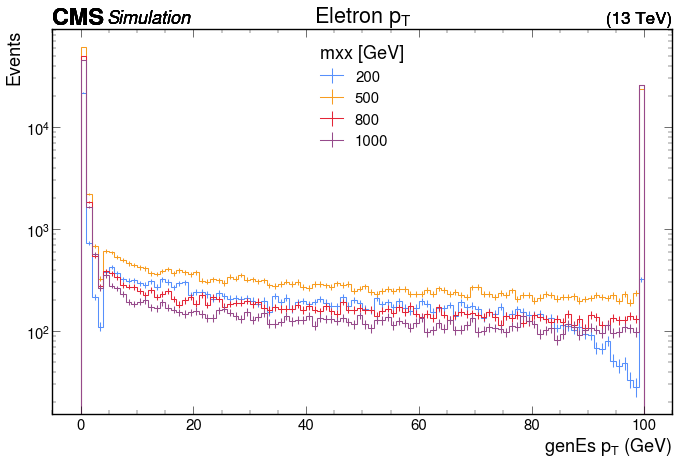

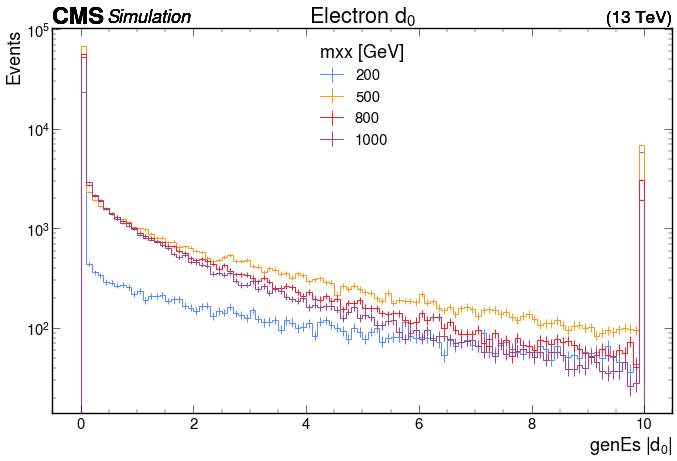

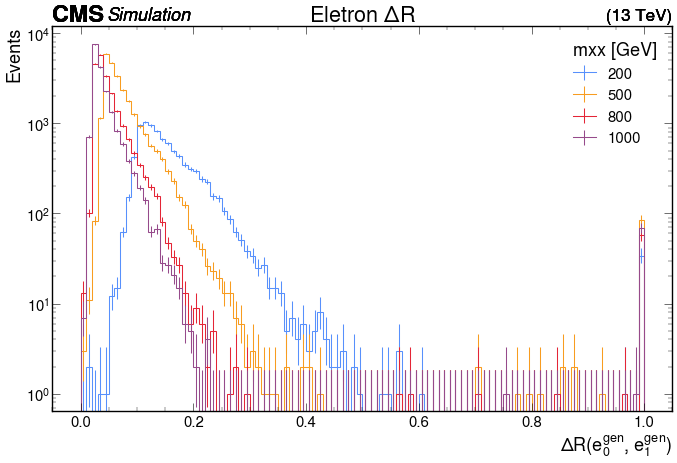

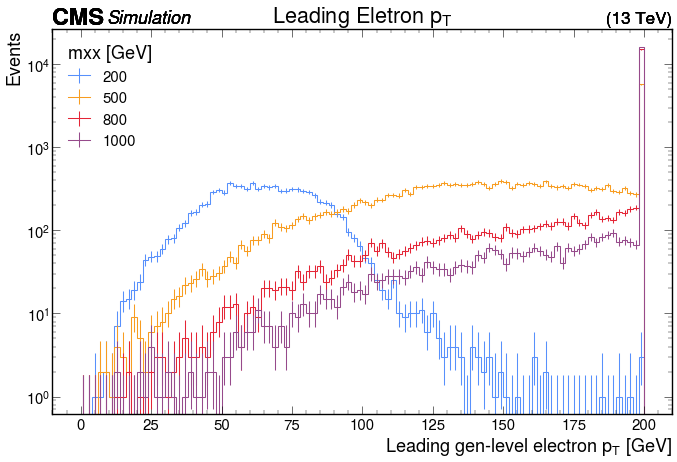

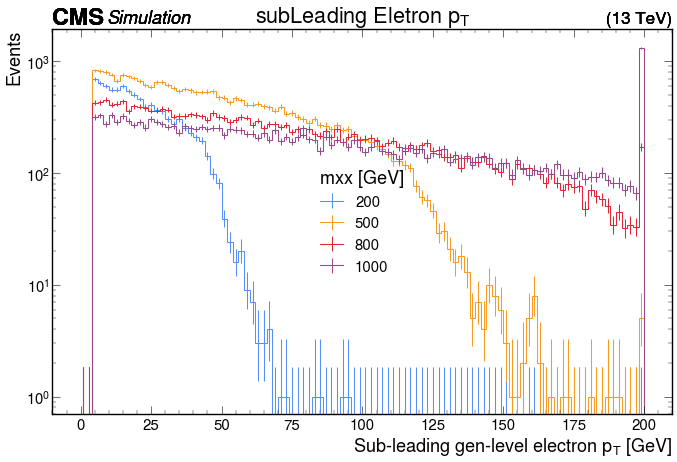

...

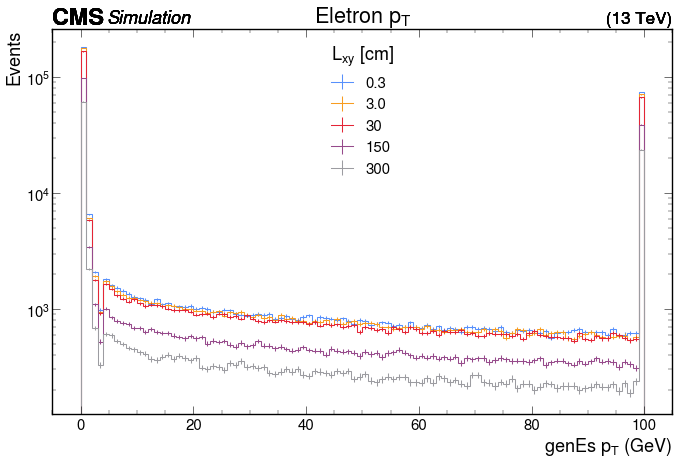

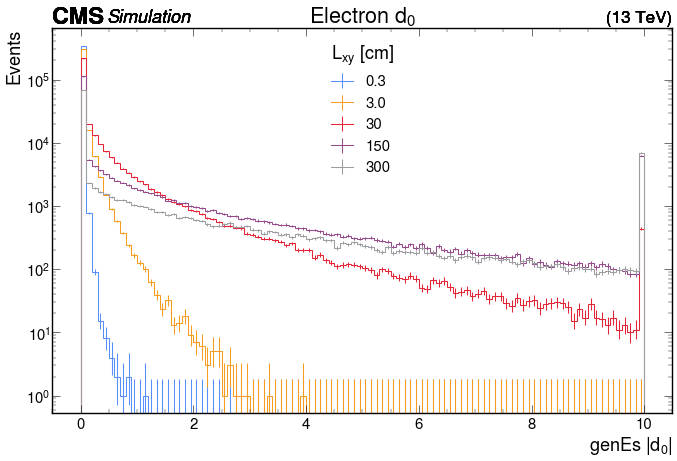

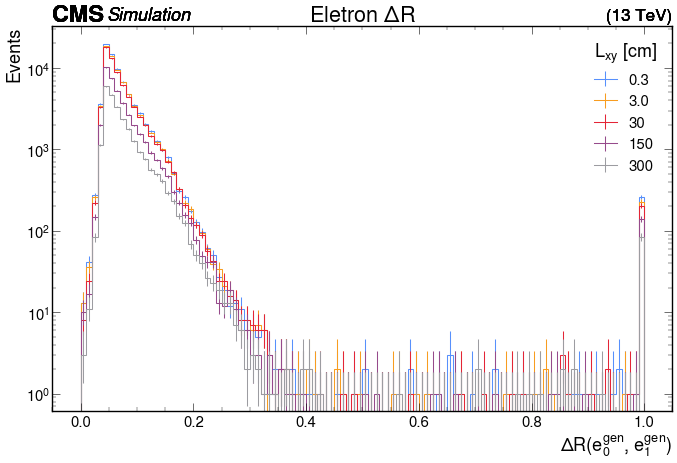

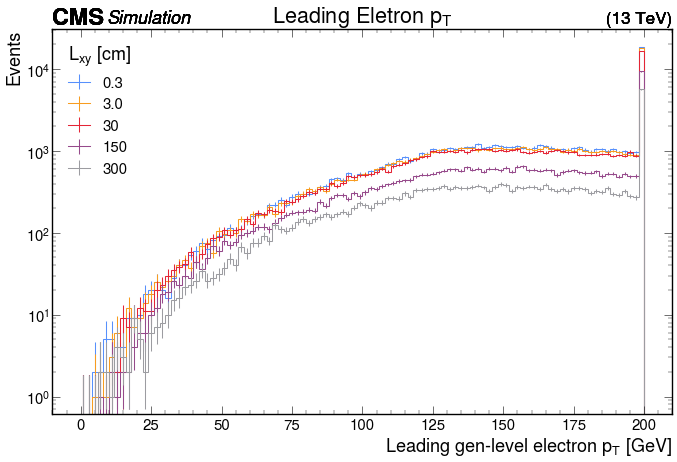

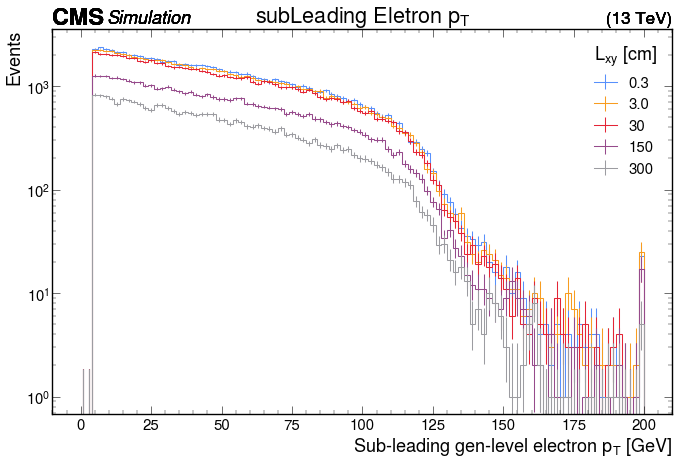

In [43]:
# Electron Variables
htplot = ["genE_pt",
          "genE_dxy",
          "genE_genE_dR",
          "genE0_pt",
          "genE1_pt"
          # "genA_from_genEs_mass",
          # "genBS_from_genAs_mass",
         ]

htname = [r"Gen Eletron $p_T$",
          r"Gen Electron $d_0$",
          r"Gen Eletron $\Delta R$",
          r"Gen Leading Eletron $p_T$",
          r"Gen subLeading Eletron $p_T$",
         ]

# changing Bs
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mxx2):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_mx[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title="mxx [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mxx_{ht}_.pdf", bbox_inches="tight", dpi=300)

# changing zd
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mzd2):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_zd[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$z_D$ [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mzd_{ht}_.pdf", bbox_inches="tight", dpi=300)

# changing lxy
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(lxy2):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_xy[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$L_{xy}$ [cm]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_lxy_{ht}_.pdf", bbox_inches="tight", dpi=300)

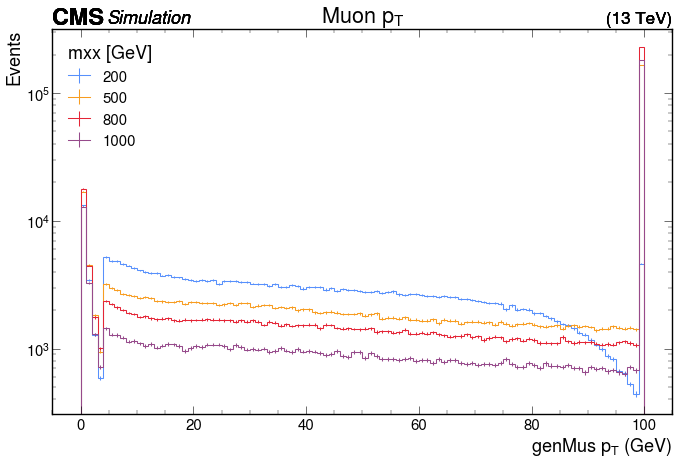

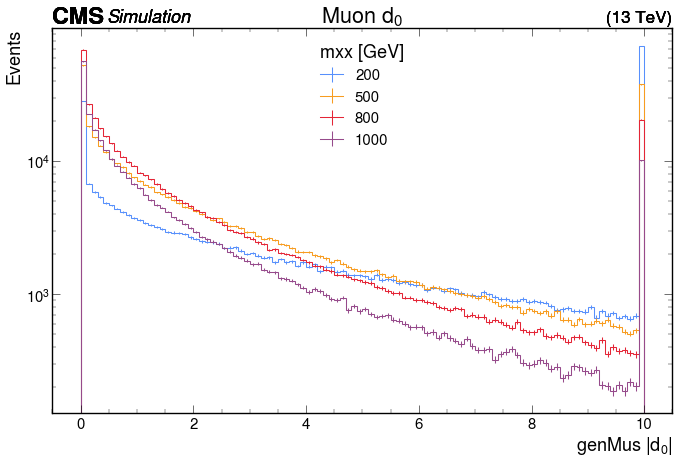

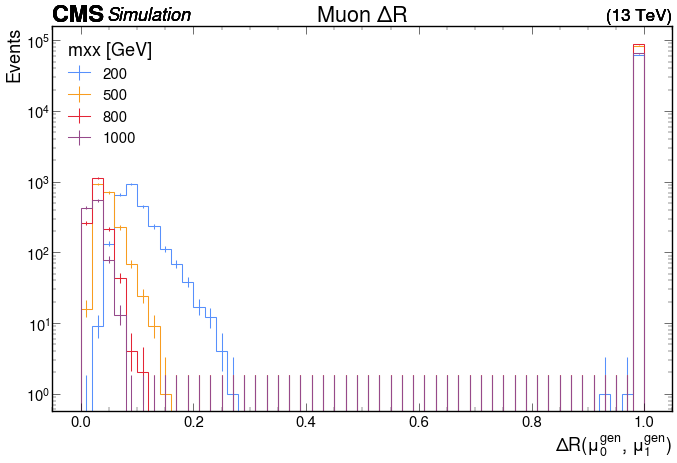

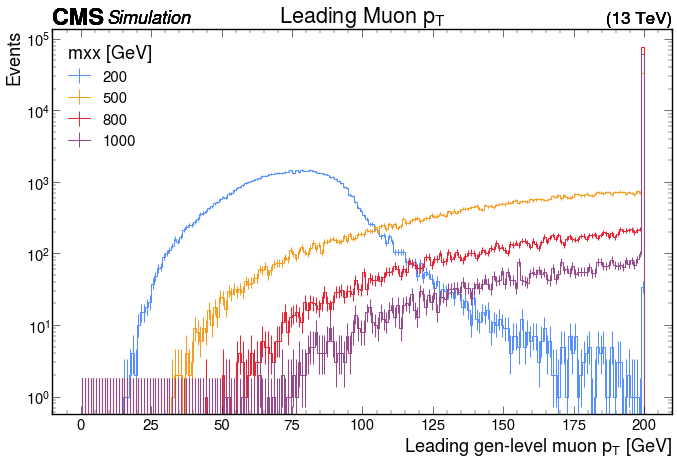

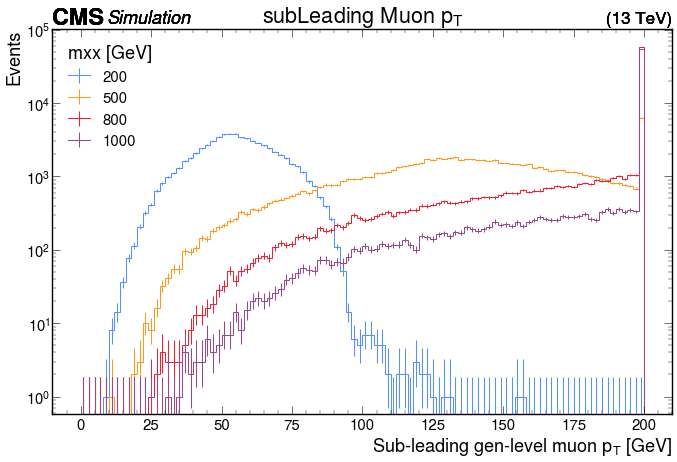

...

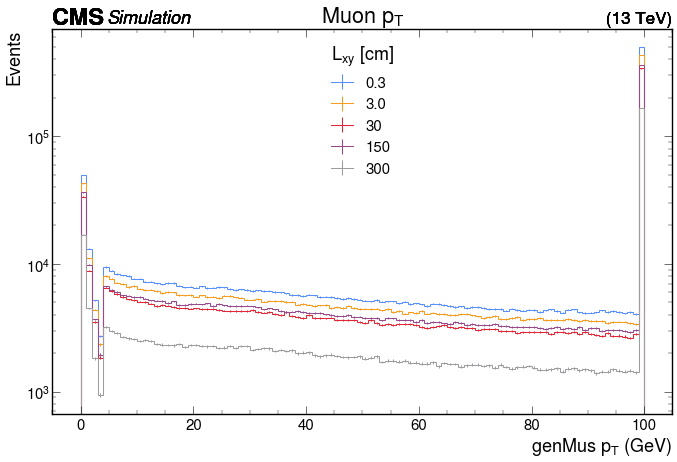

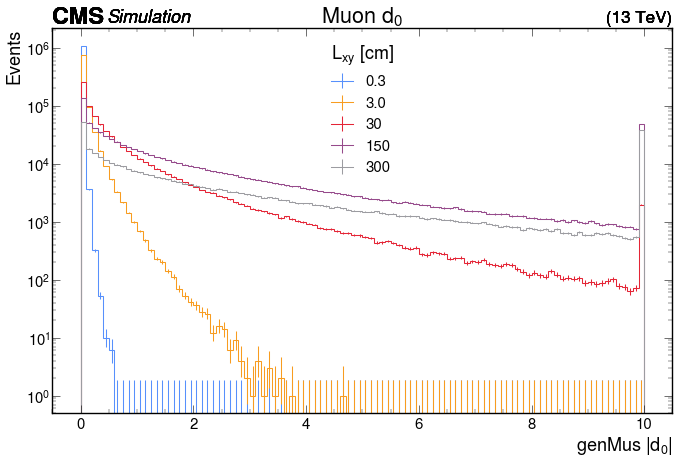

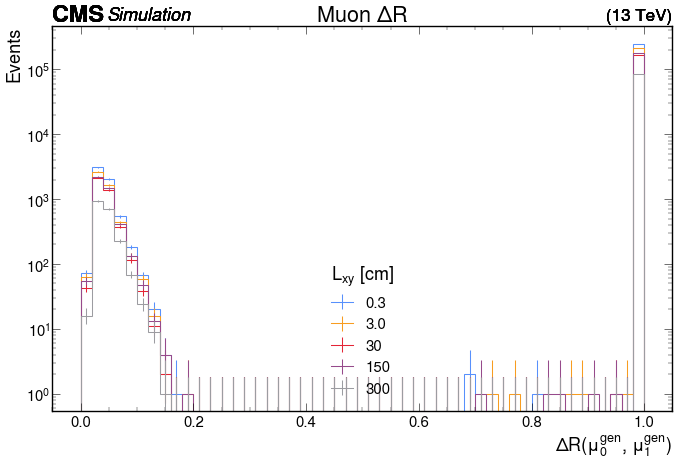

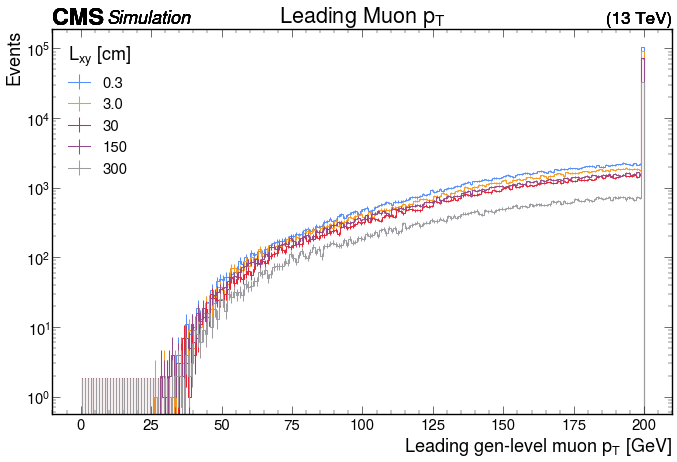

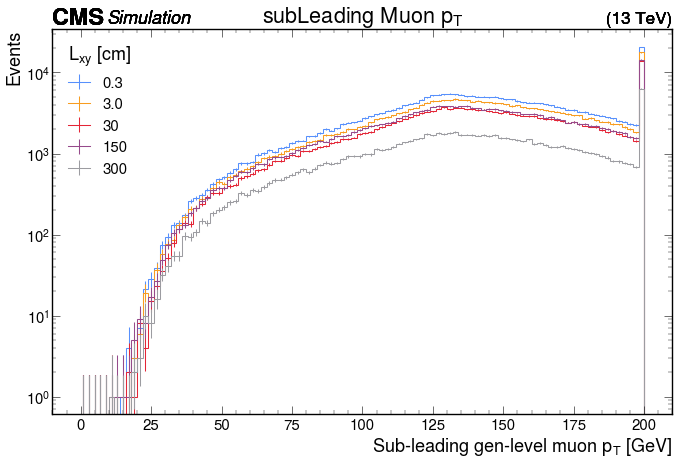

In [44]:
# Muon Variables
htplot = ["genMu_pt",
          "genMu_dxy",
          "genMu_genMu_dR",
          "genMu0_pt",
          "genMu1_pt",
          "muon_pt",
          "muon_dxy",
          "muon_muon_dR",
         ]

htname = [r"Gen Muon $p_T$",
          r"Gen Muon $d_0$",
          r"Gen Muon $\Delta R$",
          r"Gen Leading Muon $p_T$",
          r"Gen subLeading Muon $p_T$",
          r"Muon $p_T$",
          r"Muon $d_0$",
          r"Muon $\Delta R$",
         ]

# changing Bs
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mxx4):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_mx[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title="mxx [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mxx_{ht}_.pdf", bbox_inches="tight", dpi=300)

# changing zd
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mzd4):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_zd[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$z_D$ [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mzd_{ht}_.pdf", bbox_inches="tight", dpi=300)

# changing lxy
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(lxy4):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_xy[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$L_{xy}$ [cm]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_lxy_{ht}_.pdf", bbox_inches="tight", dpi=300)

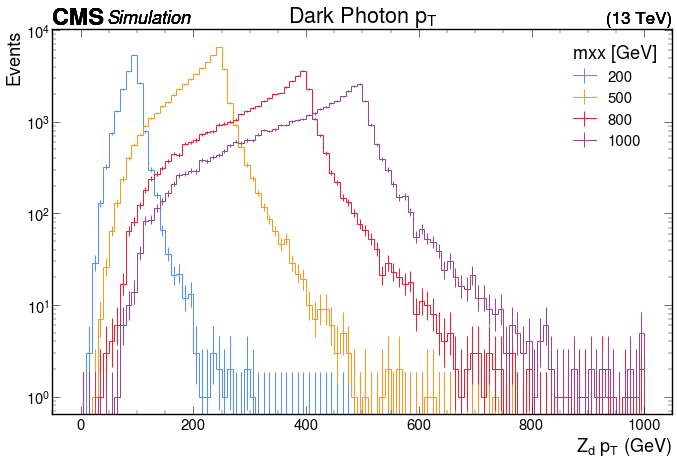

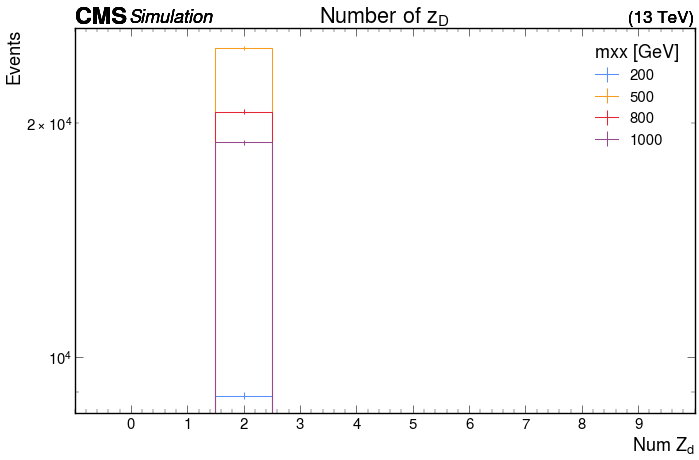

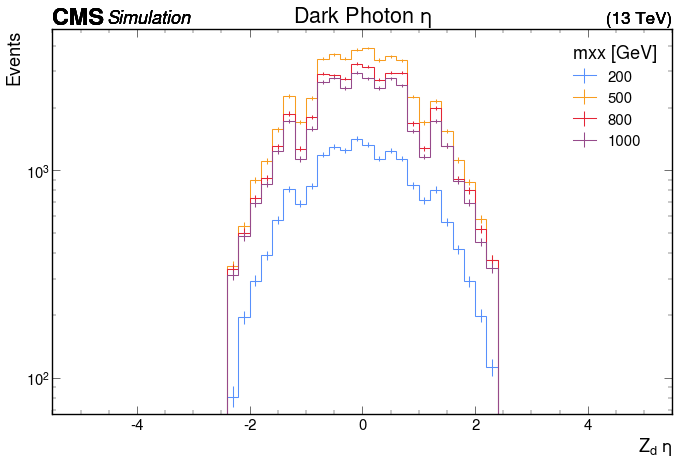

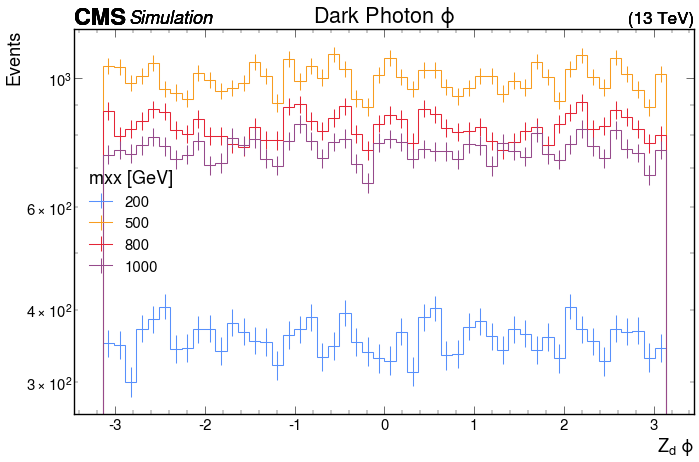

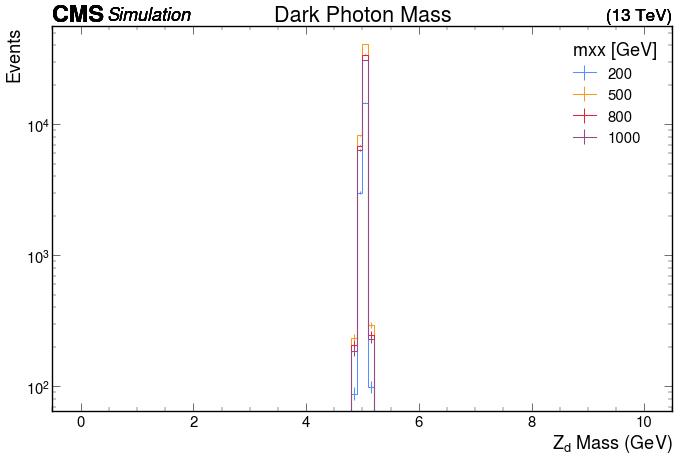

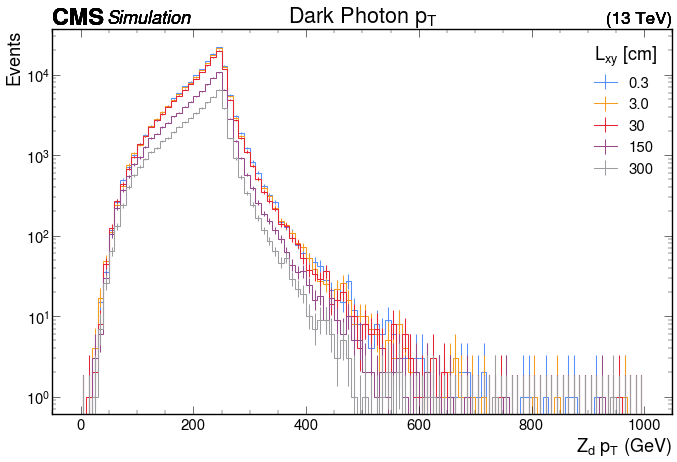

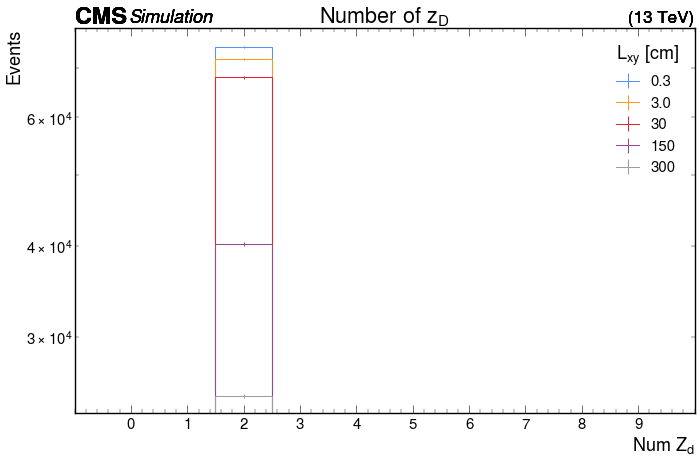

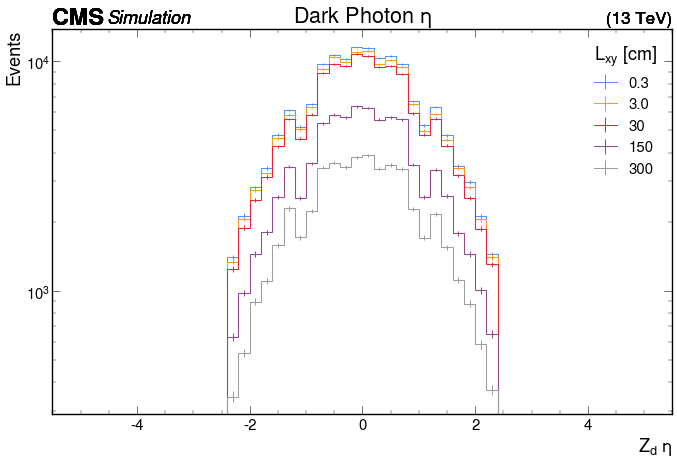

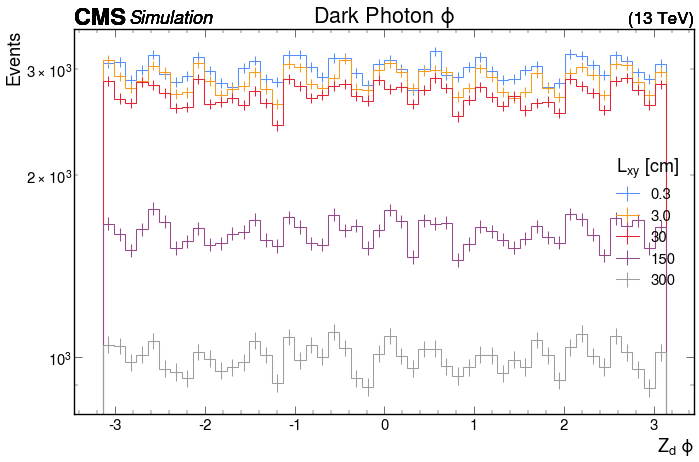

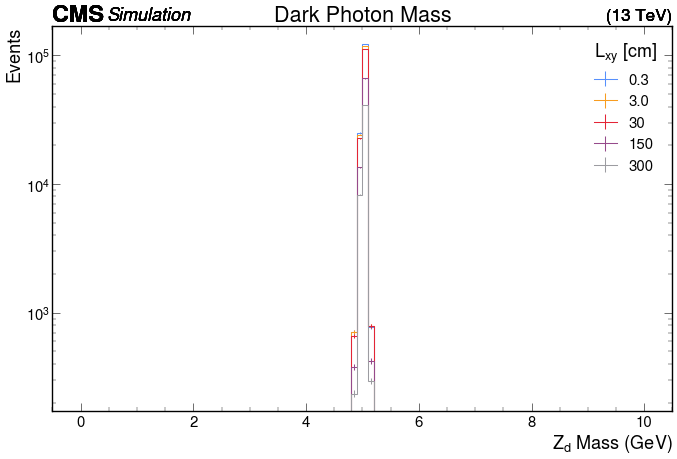

In [39]:
# Dark Photon Variables

htplot = ["genAs_pt", "genA_n", "genAs_eta", "genAs_phi", "genAs_mass"]
htname = [r"Dark Photon $p_T$", r"Number of $z_D$", r"Dark Photon $\eta$", r"Dark Photon $\phi$", r"Dark Photon Mass"]

#changing Bs mass
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mxx2):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_mx[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title="mxx [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mxx_{ht}_.pdf", bbox_inches="tight", dpi=300)

#changing lxy
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(lxy2):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_xy[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$L_{xy}$ [cm]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_lxy_{ht}_.pdf", bbox_inches="tight", dpi=300)

KeyError: 'lj_lj_absdphi'

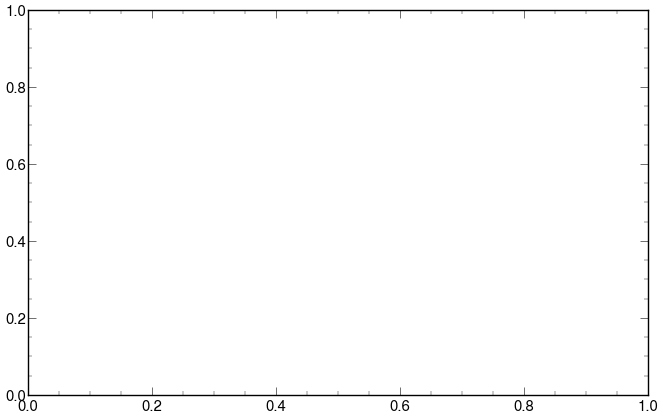

In [45]:
# LJ-LJ Variables
htplot = ["lj_lj_absdphi",
          "lj_lj_invmass",
          "lj_lj_absdR",
          "lj_lj_absdeta"
         ]

htname = [r"LJs $\Delta \Phi$",
          r"LJs inv Mass$",
          r"LJs $\Delta R$",
          r"LJs $\eta$",
         ]

# changing Bs
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mxx4):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_mx[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title="mxx [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mxx_{ht}_.pdf", bbox_inches="tight", dpi=300)

# changing zd
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(mzd4):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_zd[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$z_D$ [GeV]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_mzd_{ht}_.pdf", bbox_inches="tight", dpi=300)

# changing lxy
for ik, ht in enumerate(htplot):
    plt.subplots(1, 1, figsize=(16, 10))
    for ij, sss in enumerate(lxy4):
        utilities.plot(output[sss]["hists"][ht][ch1, :], label = lab_xy[ij])
    plt.title(htname[ik])
    plt.ylabel("Events")
    plt.yscale("log")
    plt.legend(title=r"$L_{xy}$ [cm]", alignment="left", loc=0)
    plt.savefig(f"clean_plots/ch5_{vr}_lxy_{ht}_.pdf", bbox_inches="tight", dpi=300)

In [40]:
# # 2mu hist
# h_names = ["Gen Electron pT",
#            "d0", 
#            "Delta R between Electrons",
#            "$Z_D$ mass", 
#            "$m_{xx}$ mass",
#            ]

# h_to_plot = ["genE_pt",
#              "genE_dxy",
#              "genE_genE_dR",
#              "genA_from_genEs_mass",
#              "genBS_from_genAs_mass",
#              ]

# var = [mxx2, mzd2, lxy2]
# svr = ["mxx", "mzd", "lxy"]

# for sv, mm in enumerate(var):
#     for hn, ht in enumerate(h_to_plot):
#         plt.subplots(1, 1, figsize=(16, 10))
#         for sss in mm:
#             utilities.plot(output[sss]["hists"][ht][ch1, :], label = sss)
#         plt.title(h_names[hn])
#         plt.ylabel("Events")
#         plt.yscale("log")
#         plt.legend(alignment="left", loc=0)
#         # plt.savefig(f"clean_plots/ch5_{ht}_{svr[sv]}_"+vr+".png", bbox_inches="tight")
#         plt.savefig(f"clean_plots/ch5_{ht}_{svr[sv]}_"+vr+".pdf", bbox_inches="tight")

In [41]:
#4mu hist
# h_names = ["Gen Muon pT"]
# h_to_plot = ["genMu_pt",]

# h_names = ["Gen Muon pT", 
#            "do",  
#            "Delta R between Muons", 
#            "$Z_D$ mass", 
#            "$m_{xx}$ mass", 
#            ]

# h_to_plot = ["genMu_pt", 
#              "genMu_dxy", 
#              "genMu_genMu_dR",
#              "genA_from_genMus_mass", 
#              "genBS_from_genAs_mass", 
#             ]

# var = [mxx4, mzd4, lxy4]
# svr = ["mxx", "mzd", "lxy"]

# for sv, mm in enumerate(var):
#     for hn, ht in enumerate(h_to_plot):
#         plt.subplots(1, 1, figsize=(16, 10))
#         for sss in mm:
#             utilities.plot(output[sss]["hists"][ht][ch1, :], label = sss)
#         plt.title(h_names[hn])
#         plt.ylabel("Events")
#         plt.yscale("log")
#         plt.legend(alignment="left", loc=0)
#         # plt.savefig(f"clean_plots/ch5_{ht}_{svr[sv]}_"+vr+".png", bbox_inches="tight")
#         plt.savefig(f"clean_plots/ch5_{ht}_{svr[sv]}_"+vr+".pdf", bbox_inches="tight", dpi=300)

In [12]:
raise SystemExit("Notebook stopped intentionally after this cell.")

SystemExit: Notebook stopped intentionally after this cell.

/usr/local/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3561: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)
